# Data load & Utils

In [1]:
import torch
print('pytorch version : ',torch.__version__)
USE_CUDA = torch.cuda.is_avalable()
print(USE_CUDA)
device = torch.device('cuda:0' if USE_CUDA else 'cpu')
print('학습을 진행하는 기기:',device)
print('cuda index:', torch.cuda.current_device())
print('gpu 개수:', torch.cuda.device_count())
print('graphic name:', torch.cuda.get_device_name())

pytorch version :  1.8.0
True
학습을 진행하는 기기: cuda:0
cuda index: 0
gpu 개수: 1
graphic name: NVIDIA GeForce RTX 3080 Ti


In [4]:
# Yolov5 Extract
%cd C:\Users\kejlk\s-hero\code\yolov5
!pip install -r requirements.txt

C:\Users\kejlk\s-hero\code\yolov5


In [5]:
#이거
from glob import glob
train_image_list = sorted(glob('C:/Users/kejlk/s-hero/code/train/images/*.jpg'))
valid_image_list = sorted(glob('C:/Users/kejlk/s-hero/code/valid/images/*.jpg'))
train_annotations_list = sorted(glob('C:/Users/kejlk/s-hero/code/train/labels/*.txt'))
valid_annotations_list = sorted(glob('C:/Users/kejlk/s-hero/code/valid/labels/*.txt'))

assert len(train_image_list) == len(train_annotations_list), "train 이미지 파일의 수와 annotation 파일의 수가 맞지 않습니다."
assert len(valid_image_list) == len(valid_annotations_list), "valid 이미지 파일의 수와 annotation 파일의 수가 맞지 않습니다."
print(len(train_image_list), len(valid_image_list))

678 120


In [6]:
sample_image_path = train_image_list[5]
sample_annot_path = train_annotations_list[5]

In [7]:
with open(sample_annot_path, 'r') as txt:
  strings = txt.readline()
  list_str = strings.split()  # str을 공란으로 쪼갬
  print(list_str)

['0', '0.477734', '0.588889', '0.389844', '0.327778']


In [8]:
#  annotation txt file로부터 ground truth logit 반환 
from pathlib import Path

def get_gt_logit(txt_path):
  txt_path = Path(txt_path)
  with open(txt_path, 'r') as txt:
    string = txt.readline()
    list_str = string.split()
    gt_logit = int(list_str[0])

  return gt_logit

In [9]:
sample_logit = get_gt_logit(sample_annot_path)
print(sample_logit)

0


In [10]:
# gt logit을 넣으면 gt name을 반환 
import yaml

def logit2name(gt_logit):  # input : annotations txt file들의 list
  label_dict = {}
  with open('C:/Users/kejlk/s-hero/code/data.yaml', 'r') as f:
    data = yaml.load(f, Loader=yaml.FullLoader)
    class_list = data['names']

    for idx in range(len(class_list)):
      name = class_list[idx]
      label_dict[idx] = name

    gt_name = label_dict[gt_logit]
    return gt_name

In [11]:
print(logit2name(sample_logit))

A_Normal


In [12]:
# annotation txt file path로부터 bbox 좌표 검출 
def get_bbox(annot_path):
  txt_path = Path(annot_path)
  with open(txt_path, 'r') as txt:
    string = txt.readline()
    list_str = string.split()
    x, y, w, h = list_str[1:5]
    
  return x, y, w, h 

In [29]:
x, y, w, h = get_bbox(sample_annot_path)
print(x, y, w, h)

0.477734 0.588889 0.389844 0.327778


# Dataset & Augmentation
## TODO

In [14]:
# define functions to visualize bounding boxes and class labels on an image
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
  
    x, y, w, h = bbox
    x_min, x_max, y_min, y_max = int(x - w/2), int(x + w/2), int(y - h/2), int(y_min + h)
   
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

In [15]:
# ignore warnings 
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")

plt.ion()   # 반응형 모드

# Custom transform (Not using Built-in YOLO augmentation)
## using torchvision

In [4]:
'''
from torchvision import transforms
import numpy as np
from PIL import Image
import os
from pathlib import Path

def Mytransform (size=224, use_resizecrop = True, use_flip = True, use_color_jitter = False, use_gray_scale = False, use_normalize = False):
    resize_crop = transforms.RandomResizedCrop(size=size)
    horizontal_flip = transforms.RandomHorizontalFlip(p=0.5)
    color_jitter = transforms.RandomApply([
        transforms.ColorJitter(0.8, 0.8, 0.8, 0.2)
    ], p=0.8)
    gray_scale = transforms.RandomGrayscale(p=0.2)
    normalize = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    to_tensor = transforms.ToTensor()
    
    transforms_array = np.array([resize_crop, horizontal_flip, color_jitter, gray_scale, to_tensor, normalize])
    transforms_mask = np.array([use_resizecrop, use_flip, use_color_jitter, use_gray_scale, True, use_normalize])
    transform = transforms.Compose(transforms_array[transforms_mask])

    return transform
'''


## using albumentations

In [16]:
!pip install -U albumentations

Requirement already up-to-date: albumentations in c:\programdata\anaconda3\lib\site-packages (1.0.3)


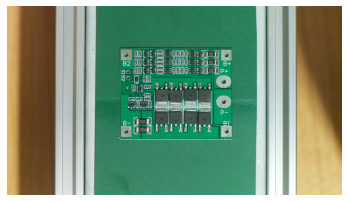

In [34]:
import albumentations as A
import albumentations.pytorch as AP
import cv2
import matplotlib.pyplot as plt
import random
import numpy as np

# define the visualization function
def visualize(image):
    plt.figure(figsize=(6, 6))
    plt.axis('off')
    plt.imshow(image)

# load an image from the disk
image = cv2.imread('C:/Users/kejlk/s-hero/code/train/images/C1_003.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
visualize(image)

transformed = transform(image=image)
transformed_image = transformed["image"]
another_transformed_image = transform(image=another_image)["image"]


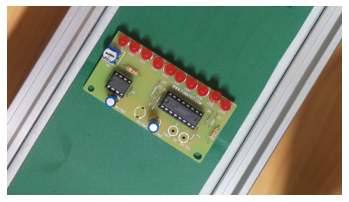

In [23]:
transform = A.ShiftScaleRotate(p=0.5)
random.seed(7) 
augmented_image = transform(image=image)['image']
visualize(augmented_image)

In [36]:
# bboxes = [x_center, y_center, width, height]


# category_ids = [ , ]

x_center = 
y_center = 
width = 
height = 
    

transform = A.Compose([
        A.Resize(416, 416),                   
        A.RandomResizedCrop(height=300,
                            width=300,
                            scale=(0.5, 1.0), 
                            ratio=(0.75, 1.25), 
                            interpolation=1, 
                            always_apply=False, 
                            p=0.5),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.Affine(rotate=(-180, 180),
                shear=(-45, 45),
                p=0.5),
        A.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
        AP.ToTensorV2()
        ]
        ,bbox_params = A.BboxParams(format='yolo', min_area=1024, min_visibility=0.3))



In [37]:
print(transform)

Compose([
  Resize(always_apply=False, p=1, height=416, width=416, interpolation=1),
  RandomResizedCrop(always_apply=False, p=0.5, height=300, width=300, scale=(0.5, 1.0), ratio=(0.75, 1.25), interpolation=1),
  HorizontalFlip(always_apply=False, p=0.5),
  RandomBrightnessContrast(always_apply=False, p=0.3, brightness_limit=(-0.2, 0.2), contrast_limit=(-0.2, 0.2), brightness_by_max=True),
  Affine(always_apply=False, p=0.5, interpolation=1, cval=0, mode=0, scale={'x': (1.0, 1.0), 'y': (1.0, 1.0)}, translate_percent=None, translate_px={'x': (0, 0), 'y': (0, 0)}, rotate=(-180, 180), fit_output=False, shear={'x': (-45, 45), 'y': (-45, 45)}, cval_mask=0),
  Normalize(always_apply=False, p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
  ToTensorV2(always_apply=True, p=1.0, transpose_mask=False),
], p=1.0, bbox_params={'format': 'yolo', 'label_fields': None, 'min_area': 1024, 'min_visibility': 0.3, 'check_each_transform': True}, keypoint_params=None, ad

In [ ]:
from imgaug import augmenters as iaa
import numpy as np
import cv2
import os



# 이미지 읽어오는 함수
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
    return images
   


# 이미지 저장 함수
def write_images(name,number,images):
    for i in range(0,len(images)):
        cv2.imwrite('C:/Users/kejlk/s-hero/code/train/augumentation.jpg'%(name,number,i), images[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")




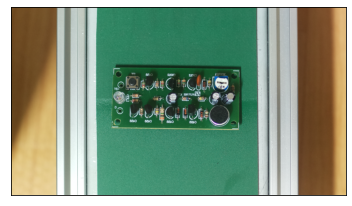

FileNotFoundError: [Errno 2] No such file or directory: '/tmp/transform.yml'

In [8]:
'''
import albumentations as A
import matplotlib.pyplot as plt
import matplotlib.patches as patches

image = plt.imread('C:/Users/kejlk/s-hero/code/train/images/A1_003.jpg')
with open('C:/Users/kejlk/s-hero/code/train/labels/A1_003.txt','r') as txt:
    strings = txt.readline()
    list_str = strings.split()
xmin, ymin, xmax, ymax = [float(list_str[1]),float(list_str[2]),float(list_str[1])+float(list_str[3]),float(list_str[3])+float(list_str[4])] 
bbox = [[xmin, ymin, xmax, ymax, list_str[0]]]

transform = A.Compose([
    A.HorizontalFlip(p=1),
], bbox_params=A.BboxParams(format='pascal_voc'))
    
transformed = transform(image=image, bboxes=bbox)   
transformed_image = transformed['image']
transformed_bboxes = transformed['bboxes']
    
#이미지 출력
plt.imshow(transformed_image)

#bounding box 그리기
for transformed_bbox in transformed_bboxes:
    xmin, ymin, xmax, ymax, category = transformed_bbox
    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor='red', fill=False)
    ax = plt.gca()
    ax.add_patch(rect)
plt.xticks([]);plt.yticks([])  
plt.show()

#data 저장하기
A.save(transform, '/tmp/transform.yml', data_format='yaml')
loaded_transform = A.load('/tmp/transform.yml', data_format='yaml')

print(loaded_transform)
''''''


## using imgaug

In [22]:
import cv2
import numpy as np
import imgaug as ia
import imgaug.augmenters as iaa

img = cv2.imread('/home/wnstnc0120/바탕화면/shero/train/images/A5.jpg',cv2.IMREAD_UNCHANGED)
with open('/home/wnstnc0120/바탕화면/shero/train/labels/A5.txt', 'r') as txt:
  strings = txt.readline()
  list_str = strings.split()
 
input_img = img[np.newaxis, :, :, :]
bbox = [ia.BoundingBox(x1 = float(list_str[1]), y1 = float(list_str[2]), 
x2 =float(list_str[1])+float(list_str[3]), y2 = float(list_str[3])+float(list_str[4]))]

output_img, output_bbox = iaa.Affine(scale = 0.8)(images = input_img, bounding_boxes = bbox)


ModuleNotFoundError: No module named 'imgaug'

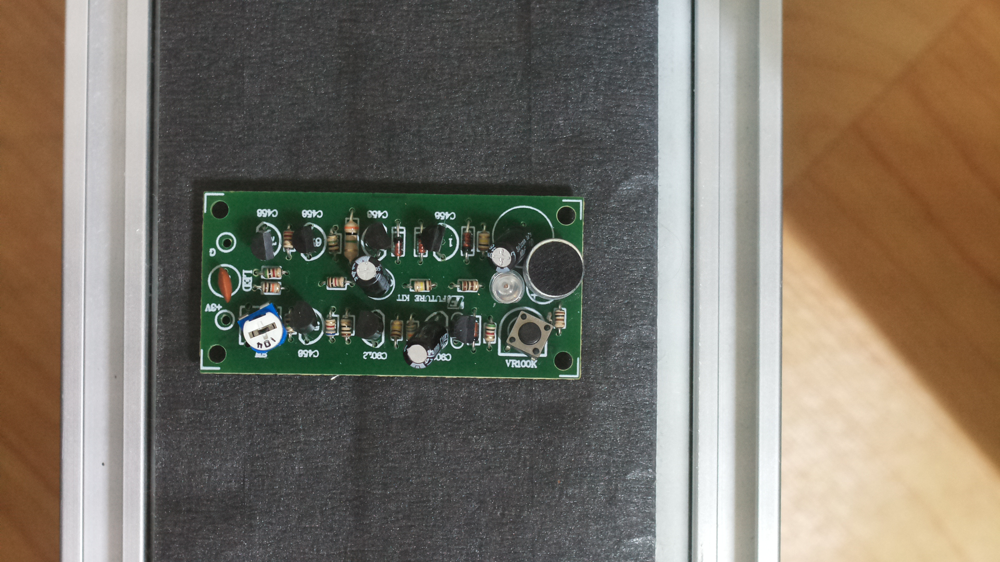

In [25]:
from PIL import Image
Image.open('C:/Users/kejlk/s-hero/code/train/images/A3_046.jpg')

# Define Dataset Class

In [26]:
# Dataset 정의
import os
import pandas as pd
import torch
from PIL import Image
from torch.utils.data import Dataset
from skimage import io
from pathlib import Path

class Mydataset(Dataset):
  # root = '/content/
  def __init__(self, root, mode = 'train', transform = None):
    self.root = os.path.join(root, mode)
    self.images = sorted(glob(self.root + '/images/*.jpg'))
    self.annotations = sorted(glob(self.root + '/labels/*.txt'))

  def __len__(self):
    assert len(self.images) == len(self.annotations), "이미지 파일의 수와 annotation 파일의 수가 맞지 않습니다."
    return len(self.annotations) 

  def __getitem__(self, idx): # dataset중에 이미지 혹은 레이블을 하나씩 불러오는 함수 
    annotation = self.annotations[idx]
    label = self.get_gt_logit(annotation)
    if self.transform:
      image = self.transform(image)
    return image, label
  

    

In [27]:
from torch.utils.data import DataLoader
root = 'C:/Users/kejlk/s-hero/code/'
transform = Mytransform()
train_dataset = Mydataset(root = root, mode = 'train', transform = AlbuTransform)
train_dataloader = DataLoader(train_dataset, batch_size = 64, shuffle = True) # To be modified
val_dataset = Mydataset(root = root, mode = 'valid', transform = AlbuTransform)
val_dataloader = DataLoader(val_dataset, batch_size = 64, shuffle = True)

NameError: name 'AlbuTransform' is not defined

# Training

In [ ]:
 '''
 hsv_h: 0.015  # image HSV-Hue augmentation (fraction) 
 hsv_s: 0.7  # image HSV-Saturation augmentation (fraction) 
 hsv_v: 0.4  # image HSV-Value augmentation (fraction) 
 degrees: 0.0  # image rotation (+/- deg) 
 translate: 0.1  # image translation (+/- fraction) 
 scale: 0.5  # image scale (+/- gain) 
 shear: 0.0  # image shear (+/- deg) 
 perspective: 0.0  # image perspective (+/- fraction), range 0-0.001 
 flipud: 0.0  # image flip up-down (probability) 
 fliplr: 0.5  # image flip left-right (probability) 
 mosaic: 1.0  # image mosaic (probability) 
 mixup: 0.0  # image mixup (probability) 
 '''

In [32]:
%cd C:/Users/kejlk/s-hero/code/yolov5
!python train.py --img 416 --batch 32 --epochs 20 --data C:/Users/kejlk/s-hero/code/data.yaml --cfg yolov5s.yaml --weights yolov5s.pt --name results_naive_m_32b_300e

C:\Users\kejlk\s-hero\code\yolov5
^C


In [ ]:
%load_ext tensorboard
%tensorboard --logdir /home/wnstnc0120/바탕화면/shero/yolov5/runs/

In [ ]:
# Train 후 Inference 진행

from IPython.display import Image
import os

sample = valid_image_list[3]

!python detect.py --weights /home/wnstnc0120/바탕화면/shero/yolov5/runs/train/results_naive_m_32b_500e/weights/best.pt --img 416 --conf 0.5 --source "{sample}"
Image(os.path.join('/home/wnstnc0120/바탕화면/shero/yolov5/runs/detect/exp 2', os.path.basename(sample)))